In [8]:
import pandas as pd
data = pd.read_excel('data_medium.xlsx')

In [9]:
data['Period'] = pd.to_datetime(data['Period'])
data = data[data['Period'].dt.year > 1989]

In [10]:
# choose the subset
data = data[data['Party'] == 'Republican']
# data = data[data['Party'] == 'Democratic']

c:\Users\xpetr\.conda\envs\LDA_testing_310\lib\site-packages\arabica\arabica_freq.py:153: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
c:\Users\xpetr\.conda\envs\LDA_testing_310\lib\site-packages\arabica\arabica_freq.py:154: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
c:\Users\xpetr\.conda\envs\LDA_testing_310\lib\site-packages\arabica\arabica_freq.py:163: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
c:\Users\xpetr\.conda\envs\LDA_testing_310\lib\site-packages\arabica\arabica_freq.py:164: FutureWarning: The default value o

<Figure size 1000x600 with 0 Axes>

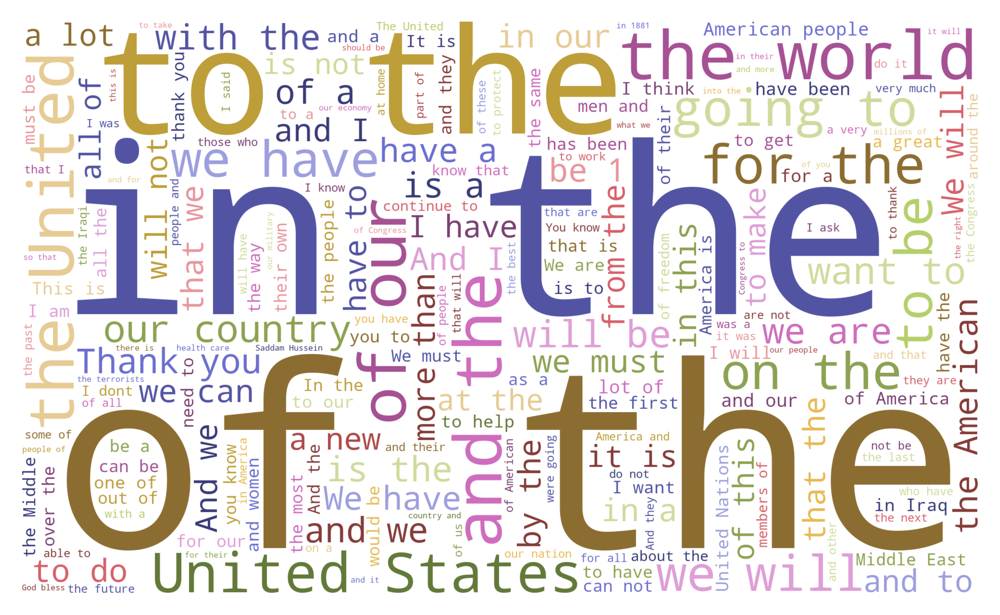

In [11]:
from arabica import cappuccino    # Import visualization method

cappuccino(text = data['Speech'],
           time = data['Period'],
           date_format = 'us',    # US-style date format to parse dates
           plot = 'wordcloud',
           ngram = 2,             # N-gram size, 1 = unigram, 2 = bigram, 3 = trigram
           time_freq = 'ungroup', # No period aggregation
           max_words = 200,       # Display 200 most frequent bigrams
           stopwords = None,      # Remove NLTK list of stopwords
           stopwords_ext = None,  # Remove extended stop words list
           skip = None,           # Cut out additional strings
           numbers = False,       # Remove numbers
           lower_case = False)    # Lowercase text

c:\Users\xpetr\.conda\envs\LDA_testing_310\lib\site-packages\arabica\arabica_freq.py:153: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
c:\Users\xpetr\.conda\envs\LDA_testing_310\lib\site-packages\arabica\arabica_freq.py:154: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
c:\Users\xpetr\.conda\envs\LDA_testing_310\lib\site-packages\arabica\arabica_freq.py:163: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
c:\Users\xpetr\.conda\envs\LDA_testing_310\lib\site-packages\arabica\arabica_freq.py:164: FutureWarning: The default value o

<Figure size 1000x600 with 0 Axes>

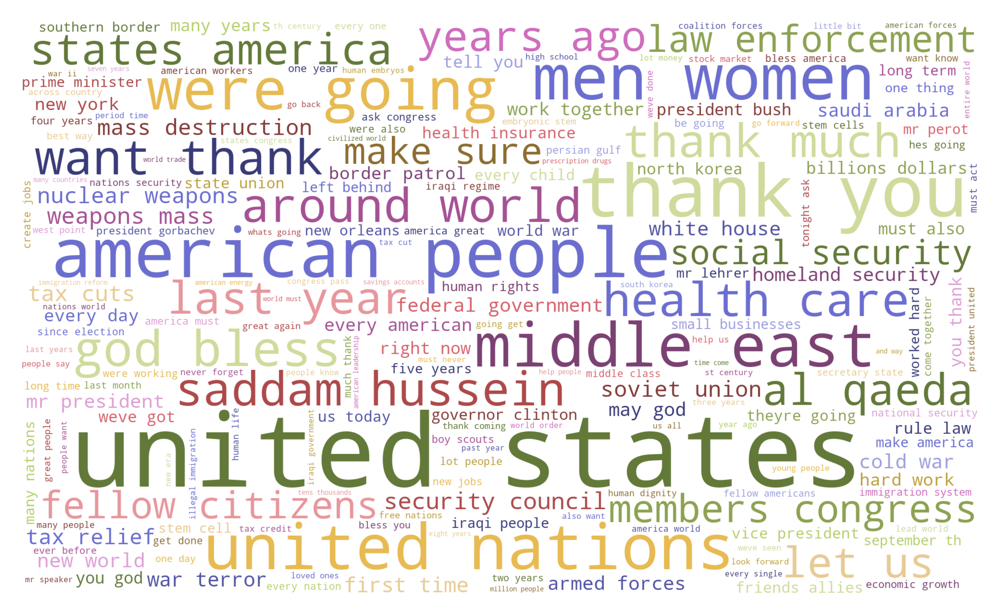

In [12]:
from arabica import cappuccino      # Import visualization method

cappuccino(text = data['Speech'],
           time = data['Period'],
           date_format = 'us',      # US-style date format to parse dates
           plot = 'wordcloud',
           ngram = 2,               # N-gram size, 1 = unigram, 2 = bigram, 3 = trigram
           time_freq = 'ungroup',   # No period aggregation
           max_words = 200,         # Display 200 most frequent bigrams
           stopwords = ['english'], # Remove English stopwords
           stopwords_ext = None,    # Remove extended stop words list
           skip = None,             # Cut out additional strings
           numbers = True,          # Remove numbers
           lower_case = True)       # Lowercase text

In [13]:
# clean data

import nltk
import re
from nltk.corpus import stopwords

nltk.download('stopwords')
stopwords_en = set(stopwords.words('english'))

def remove_stopwords(text):
  list_item=text.split()
  return ' '.join([word.lower() for word in list_item if word.lower() not in stopwords_en])


def remove_punc_numb(text):
  text = re.sub(r'[.,]',' ',text)                            # replace comma and dot with a space
  punct = r'''!()+-[]{}|;:'"\<>/?@#$£%^&*_~…0123456789“”'''  # remove all non alphabet characters
  text = ' '.join([''.join(char for char in word if char not in punct)
        for word in text.split()])

  return re.sub(r'\s+', ' ', text.strip())

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\xpetr\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [14]:
data=pd.DataFrame(data['Speech'].apply(remove_stopwords))
data=pd.DataFrame(data['Speech'].apply(remove_punc_numb))

In [15]:
import nltk
from nltk.util import ngrams

data['gram2']=[list(ngrams(text.split(),2))for text in data['Speech']]

In [16]:
# keep only frequent tokens (>10)
from collections import Counter            # counting term frequencies
from operator import itemgetter            # accessing items in table
from nltk.lm.preprocessing import flatten  # flatten list to string

count_gram2= Counter(flatten(list_item for list_item in data['gram2']))
list_gram2=sorted(list(count_gram2.items()),key=itemgetter(1),reverse=True)
list_gram2_10=[gram[0] for gram in list_gram2 if int(gram[1])>10]
data['gram2_10']=[' '.join('_'.join([gram[0],gram[1]]) for gram in list_gram
                    if gram in list_gram2_10) for list_gram in data['gram2']]

In [17]:
# Function to remove tokens from a given text
def remove_tokens(text, tokens):
    return ' '.join([word for word in text.split() if word.lower() not in tokens])

tokens_to_remove = ['let_us','st_century','right_now','last_year','united_states','weve_got','make_sure','years ago',
                    'thank_you','also_know','first_time','four_years','two_years','were_going','be_going','years_ago',
                    'want_thank','mr_president','thank_much','ive_seen','let_say','right_thing','get_done',
                    'move_forward','long_term','every_day','cant_afford','last_two','one_another',
                    'vice_president','long_time','right_away','id_like','even_though','th_century','theyve_got','five_years',
                    'last_days','you_thank','theyre_going','tell_you','hes_going','weve_seen',
                    'much_thank','feel_like','you_mr','lot_people','next_year','going_keep','last_week','little_bit','and_way','one_minute','ive_got','would_say','never_ever','mr_perot','mr_lehrer']  #TADY


# Apply the remove_tokens function to the Series
data['gram2_10'] = data['gram2_10'].apply(lambda x: remove_tokens(x, tokens_to_remove))

In [18]:
# Create bag-of-words corpus

import gensim.corpora as corpora

list_text=[[word.strip() for word  in  strg.split()] for strg in data['gram2_10']]
dict_text = corpora.Dictionary(list_text)
corpus = [dict_text.doc2bow(docm) for docm in list_text]

In [19]:
# Train the LDA model

from gensim.models import LdaModel

# Set training parameters.
num_topics = 6
chunksize = 2000
passes = 20
iterations = 400
eval_every = None

                             # Make an index to word dictionary.
temp = dict_text[0]          # This is only to "load" the dictionary.
id2word = dict_text.id2token

LDA_model = LdaModel(
    corpus=corpus,
    id2word=id2word,
    chunksize=chunksize,
    alpha='auto',
    eta='auto',
    iterations=iterations,
    num_topics=num_topics,
    passes=passes,
    eval_every=eval_every,
    random_state=1          # set the random_state to avoid the model
                            # from generating different results during
                            # each runs
)

In [20]:
# prep chart settings
# adapted from https://scikit-learn.org/stable/auto_examples/applications/plot_topics_extraction_with_nmf_lda.html
import matplotlib.pyplot as plt

def plot_topic_word_score(list_topic_term_key_value_score, title):
    # fig, axes = plt.subplots(2, 5, figsize=(30, 15), sharex=True)
    # fig, axes = plt.subplots(2, 5, figsize=(40, 15), sharex=True)  # 10 topics
    # fig, axes = plt.subplots(3, 3, figsize=(40, 15), sharex=True)  # 9 topics
    # fig, axes = plt.subplots(4, 2, figsize=(15, 20), sharex=True)  # 8 topics
    # axes[-1, -1].remove()                                          # 7 topics
    fig, axes = plt.subplots(3, 2, figsize=(15, 15), sharex=True)    # 6 topics
    #fig, axes = plt.subplots(2, 2, figsize=(40, 15), sharex=True)   # 4 topics


    axes = axes.flatten()
    for topic_indx,item in enumerate(list_topic_term_key_value_score):
      list_term = [subitem[1] for subitem in  item]
      list_score = [subitem[2] for subitem in  item]

      ax = axes[topic_indx]

      hbars = ax.barh(list_term,list_score, height=0.7,label=list_score)
      ax.bar_label(hbars, fmt='%.2f', fontsize=14)

      ax.set_title(f"Topic {topic_indx +1}", fontdict={"fontsize": 25})
      ax.invert_yaxis()
      ax.tick_params(axis="both", which="major", labelsize=15)
      fig.suptitle(title, fontsize=30)

    plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)
    plt.show()


In [21]:
# prep list_topic_term_key
topic_term_keys=[]
topic_term_values=[]
topic_term_scores=[]
topic_term_key_value_scores=[]

for i in range (num_topics):
  term_key=[]
  term_value=[]
  term_score=[]
  term_key_value_score=[]
  for item in LDA_model.get_topic_terms(i):
    term_key.append(item[0])
    term_value.append(id2word[item[0]])
    term_score.append(item[1])
    term_key_value_score.append([item[0],id2word[item[0]],item[1]])

  topic_term_keys.append(term_key)
  topic_term_scores.append(term_score)
  topic_term_values.append(term_value)
  topic_term_key_value_scores.append(term_key_value_score)

In [22]:
print(topic_term_keys)
print(topic_term_values)
print(topic_term_scores)
print(topic_term_key_value_scores)

[[28, 75, 21, 239, 2, 44, 27, 16, 244, 122], [2, 258, 200, 301, 18, 290, 199, 206, 297, 286], [217, 114, 28, 47, 120, 34, 154, 298, 88, 147], [84, 75, 79, 83, 82, 5, 28, 2, 18, 80], [230, 231, 227, 228, 225, 229, 292, 42, 21, 223], [206, 2, 20, 172, 293, 201, 295, 145, 68, 66]]
[['men_women', 'middle_east', 'health_care', 'al_qaeda', 'american_people', 'social_security', 'members_congress', 'fellow_citizens', 'war_terror', 'nuclear_weapons'], ['american_people', 'border_patrol', 'billions_dollars', 'boy_scouts', 'god_bless', 'southern_border', 'tax_relief', 'tax_cuts', 'since_election', 'america_great'], ['west_point', 'cold_war', 'men_women', 'states_america', 'military_force', 'new_world', 'world_war', 'american_energy', 'american_leadership', 'make_america'], ['united_nations', 'middle_east', 'saddam_hussein', 'u_n', 'security_council', 'around_world', 'men_women', 'american_people', 'god_bless', 'saudi_arabia'], ['stem_cell', 'stem_cells', 'embryonic_stem', 'human_embryos', 'cell_r

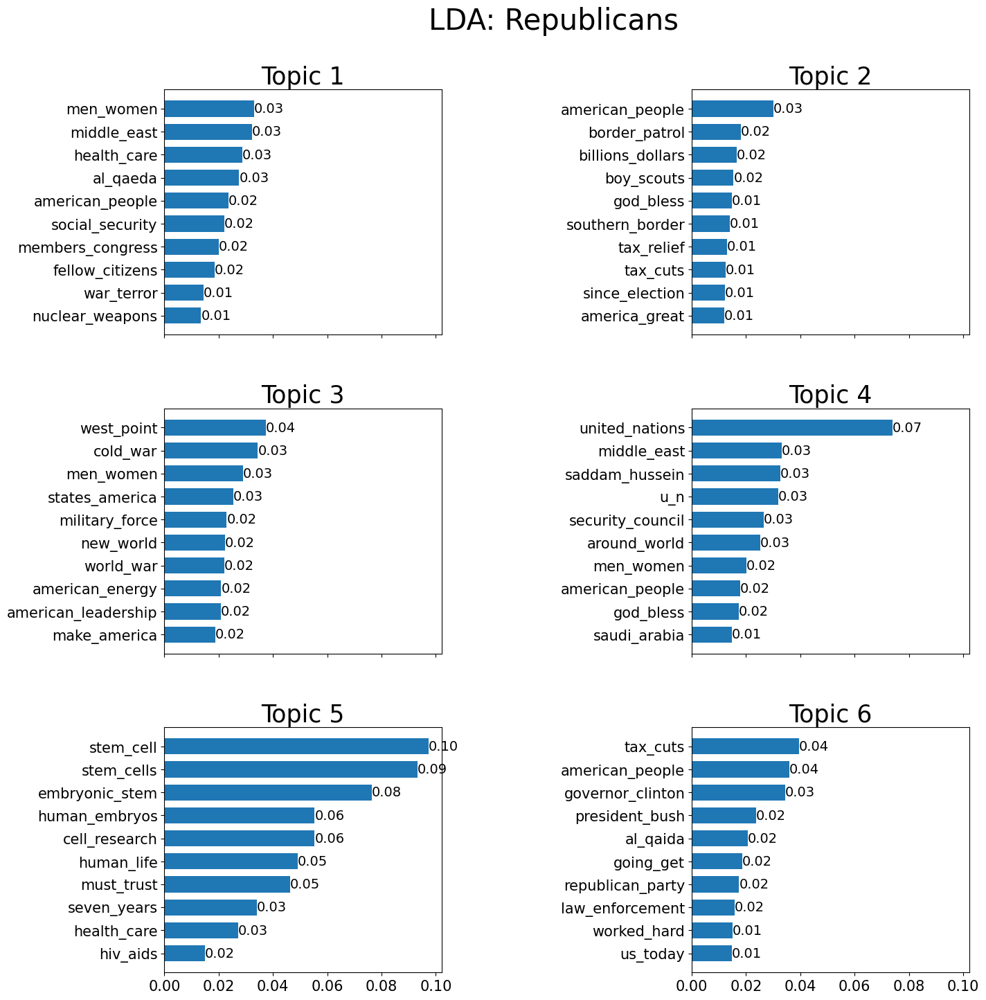

In [23]:
plot_topic_word_score(topic_term_key_value_scores,"LDA: Republicans")
# plot_topic_word_score(topic_term_key_value_scores,"LDA: Democrats")